<a href="https://colab.research.google.com/github/SCS-Technology-and-Innovation/DACS/blob/main/DTDA/sync.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
count = 50

from random import random

# coordinates of the fireflies
x = [ random() for fly in range(count) ]
y = [ random() for fly in range(count) ]

def randrange(low, high):
  span = high - low
  return span * random() + low

# range of initial intrinsic frequencies (as degrees per unit of time)
minFreq = 11
maxFreq = 17
freq = [ randrange(minFreq, maxFreq) for fly in range(count) ]

# initial phase of the oscillator (in degrees)
phase = [ randrange(0, 360) for fly in range(count) ] 

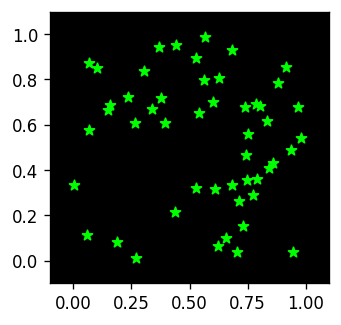

In [2]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize = (3, 3), dpi = 120)
plt.rcParams['axes.facecolor'] = 'black'

flysize = 40
base = 'lime'
span = [ -0.1, 1.1 ]
plt.xlim(span)
plt.ylim(span)
plt.scatter(x, y, c = base, marker = '*', s = flysize) # draw each firefly

![Illustration on the relationship between the angle (alpha) and the intrinsic frequency (f)](https://github.com/SCS-Technology-and-Innovation/DACS/blob/main/DTDA/img/sync/update.png?raw=true)

Let's think of a single oscillator like this.

In [3]:
ph = 340 # phase
fr = 13 # frequency

fullCircle = 360

def restore(angle):
  while angle > fullCircle:
    angle -= fullCircle
  if angle < 0:
    angle += fullCircle
  return angle

def spin(w): # takes a parameter we do not need, let's not think about it
  global ph
  ph += fr
  ph = restore(ph)

for step in range(5):
  spin(step)
  print(f'Now at {ph}')

Now at 353
Now at 6
Now at 19
Now at 32
Now at 45


In [4]:
from math import pi
fullRadians = 2 * pi

def d2r(degree): # convert degrees into radians
  return fullRadians * (degree / fullCircle)

rod = (0, 1)

def spin(w): # let's make it draw things (using radians)
  global ph
  rad = d2r(ph)
  a = (rad, rad)
  plt.polar(a, rod, c = base)
  ph += fr
  ph %= fullCircle

print(ph, d2r(ph))

45 0.7853981633974483


We can look at what this looks like from the point of view of a single firefly flashing away at its own frequency. 

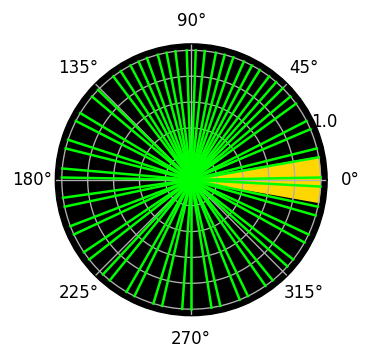

In [5]:
from matplotlib import rc
rc('animation', html='jshtml')
import matplotlib.animation as animation

span = 10 # flash zone (twice this wide)
flash = 'gold'
high= fullCircle - span
low = span

duration = 60 # how many steps to simulate
# polar coordinates
fig = plt.figure(figsize = (3, 3), dpi = 120)
plt.clf() # clear in case we have ran this before
plt.axes(projection = 'polar')
# color the flash zone
rh = d2r(high)
rl = d2r(low)
a = ( rh, rh, 0, rl, rl )
r = ( 0, 1, 1, 1, 0 )
plt.fill(a, r, c = flash)

animation.FuncAnimation(fig, spin, frames = duration, repeat = False)

Instead of drawing a bunch of spinning rods, let's just draw our fireflies in the base color when they are not flashing and the flash color when they are.

In [6]:
def step(w): #
    global timer
    flashing = [ p > high or p < low for p in phase ] # which flies should flash
    colors = [ flash if f else base for f in flashing ] # which color they need to be drawn in
    plt.scatter(x, y, c = colors, marker = '*', s = flysize) # draw each firefly
    for fly in range(count): # update each fly
      phase[fly] += freq[fly] # spin the oscillator
      phase[fly] = restore(phase[fly]) # back in the circle

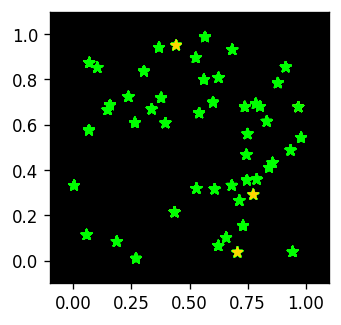

In [7]:
duration = 30 # how many steps to simulate
fig = plt.figure(figsize = (3, 3), dpi = 120)
span = [ -0.1, 1.1 ]
plt.xlim(span)
plt.ylim(span)

import matplotlib.animation as animation
animation.FuncAnimation(fig, step, frames = duration, repeat = False)

Now, let's allow each fly to *observe* (hear, see, sense in some way) any **neighboring** fly within a specified, circular *range*.

In [8]:
visual = 0.4 

from math import sqrt

def dist(p1, p2):
  return sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)

from collections import defaultdict 

neighbors = defaultdict(set)
pos = [ p for p in zip(x, y) ]
for f1 in range(count):
  p1 = pos[f1]
  for f2 in range(f1 + 1, count):
    p2 = pos[f2]
    if dist(p1, p2) < visual:
      neighbors[f1].add(f2)
      neighbors[f2].add(f1)

buddies = dict()

for fly in neighbors:
  buddies[fly] = len(neighbors[fly])
  listing = ' '.join( [ str(other) for other in neighbors[fly] ] )
  print(f'Fly {fly} has {buddies[fly]} neighbors')

Fly 0 has 24 neighbors
Fly 1 has 19 neighbors
Fly 3 has 11 neighbors
Fly 4 has 17 neighbors
Fly 8 has 25 neighbors
Fly 9 has 14 neighbors
Fly 10 has 30 neighbors
Fly 11 has 22 neighbors
Fly 13 has 22 neighbors
Fly 15 has 31 neighbors
Fly 18 has 18 neighbors
Fly 19 has 20 neighbors
Fly 23 has 15 neighbors
Fly 24 has 21 neighbors
Fly 26 has 13 neighbors
Fly 30 has 19 neighbors
Fly 31 has 18 neighbors
Fly 32 has 19 neighbors
Fly 37 has 25 neighbors
Fly 38 has 20 neighbors
Fly 41 has 23 neighbors
Fly 42 has 25 neighbors
Fly 43 has 17 neighbors
Fly 46 has 26 neighbors
Fly 48 has 12 neighbors
Fly 6 has 18 neighbors
Fly 27 has 16 neighbors
Fly 28 has 11 neighbors
Fly 2 has 13 neighbors
Fly 5 has 25 neighbors
Fly 12 has 13 neighbors
Fly 14 has 19 neighbors
Fly 16 has 10 neighbors
Fly 17 has 16 neighbors
Fly 29 has 25 neighbors
Fly 34 has 5 neighbors
Fly 39 has 16 neighbors
Fly 49 has 21 neighbors
Fly 40 has 6 neighbors
Fly 20 has 23 neighbors
Fly 22 has 20 neighbors
Fly 25 has 24 neighbors
Fly

[Kuramoto model](https://en.wikipedia.org/wiki/Kuramoto_model): each pair of neighbors is *coupled* and their phase updates depend on each others phases

In [9]:
from math import sin # note: this is in RADIANS, not in degrees

def contribution(ownPhase, anotherPhase): # take the sine of the phase difference
  return sin(anotherPhase - ownPhase)

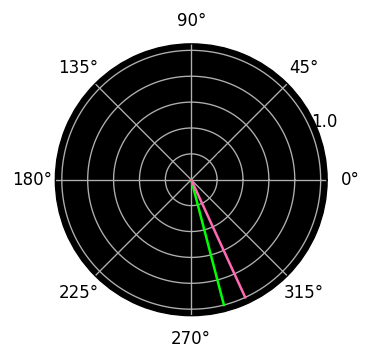

In [10]:
# everything in radians to begin with
r1 = d2r(320) 
r2 = d2r(70)
f1 = d2r(17) # moves a bit less on its own
f2 = d2r(22) # moves a bit more on its own

def rr(angle):
  while angle > fullRadians:
    angle -= fullRadians
  if angle < 0:
    angle += fullRadians
  return angle

c = 0.25 # coupling constant

# add some asymmetrical multiplicative observation noise
def noise(magnitude = 0.05):
  offset = magnitude * random()
  if random() < 0.5:
    return 1 - offset
  else:
    return 1 + offset


es = [] # so we can look at how the effects evolve

def pair(w): 
  global r1, r2, es
  plt.clf()
  plt.polar(( r1, r1 ), rod, c = base) 
  plt.polar(( r2, r2 ), rod, c = 'hotpink') # different color 
  # compute the effect
  e = c * contribution(r1, r2)
  es.append(e)
  # compute the phase deltas
  d1 = f1 + e * noise() # own frequency and the effect of the other one
  d2 = f2 - e * noise() # opposite effect, same magnitude
  # apply the phase deltas (and stay on the circle, in radians)
  r1 = rr(r1 + d1) 
  r2 = rr(r2 + d2)

duration = 50
fig = plt.figure(figsize = (3, 3), dpi = 120)
plt.axes(projection = 'polar')

animation.FuncAnimation(fig, pair, frames = duration, repeat = False)

In [11]:
print('start', ' '.join( [ f'{e:.2f}' for e in es[:10] ] ))
print('end', ' '.join( [ f'{e:.2f}' for e in es[-10:] ] ))

start 0.23 0.25 0.22 0.17 0.12 0.08 0.06 0.05 0.05 0.05
end 0.04 0.04 0.04 0.04 0.04 0.04 0.04 0.04 0.04 0.04


Now we can make a new step routine for the animation that uses these phase updates.

In [12]:
# embrace the radians
rf = [ d2r(f) for f in freq ]
rp = [ d2r(p) for p in phase ] 

def kuramoto(fly, coupling = 0.3):
  effect = sum( [ contribution(rp[fly], rp[other]) for other in neighbors[fly] ] )
  return rf[fly] + (coupling / buddies[fly]) * effect

from math import fabs
very = 0.15

for fly in range(count): 
  calculated = kuramoto(fly)
  own = rf[fly]
  if fabs(calculated - own) > very : # if very different
    print(f'The phase delta for fly {fly} is {calculated:.2f} while its own frequency is {own:.2f}') 

In [13]:
# express the flashing range in radians, too
rh = d2r(high)
rl = d2r(low)

def sync(z):  
    global rp
    flashing = [ p > rh or p < rl for p in rp ] # which flies should flash
    colors = [ flash if f else base for f in flashing ] # which color they need to be drawn in
    plt.scatter(x, y, c = colors, marker = '*', s = flysize) # draw each firefly
    for fly in range(count): # update each fly
      rp[fly] = rr(rp[fly] + kuramoto(fly)) # apply the phase update

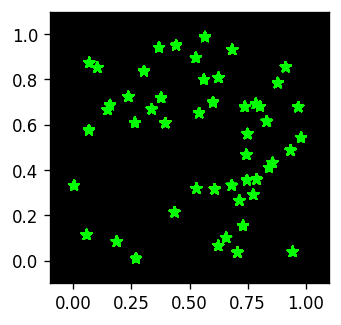

In [14]:
duration = 200
fig = plt.figure(figsize = (3, 3), dpi = 120)
plt.xlim(span)
plt.ylim(span)

animation.FuncAnimation(fig, sync, frames = duration, repeat = False)